Importing Useful Libraries

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
from PIL import Image
import clip
import pandas as pd
from IPython.display import display
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt 
import time
import gdown
import zipfile
import os
import cv2
import json
from torch.utils.data import Dataset, DataLoader

Generating the masks for the dataset using OpenCV

In [3]:
import cv2
import numpy as np

def generate_mask(img, polygons):
    # Create an empty mask and then fill in the polygons
    mask = np.zeros(img.shape[:2], dtype=np.uint8)

    for polygon in polygons:
        # Convert the polygon to a NumPy array
        polygon = np.array(polygon, dtype=np.int32)

        # Fill the polygon in the mask
        cv2.fillPoly(mask, [polygon], 1)

    return mask

In [4]:
#GENERATING MASKS FOR TRAIN SET IMAGES FOLDER

dataset_path = 'phrasecut_dataset/VGPhraseCut_V0_sub_train+val/train/images'
output_mask_path = 'train_mask'
# Create the output mask directory if it doesn't exist
os.makedirs(output_mask_path, exist_ok=True)

# Load the annotation file
annotations_file = 'phrasecut_dataset/VGPhraseCut_V0_sub_train+val/train/refer_train.json'
with open(annotations_file, 'r') as f:
    annotations = json.load(f)

count = 0
# Iterate over the annotations
for annotation in annotations:
    image_id = annotation['image_id']
    image_name = f'{image_id}.jpg'
    image_path = os.path.join(dataset_path, image_name)

    # Check if the image file exists
    if not os.path.exists(image_path):
        continue

    # Load the image
    image = cv2.imread(image_path)

    # Check if the image was loaded successfully
    if image is None:
        continue

    # Get the list of phrases and polygons for the image
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    text_prompt = annotation['phrase']
    # print(text_prompt)
    for polygons in annotation['Polygons']:
        poly_part = []
        for poly in polygons:
            poly_part.append(poly)
        mask1 = generate_mask(image, poly_part)
        mask = cv2.bitwise_or(mask1, mask)
    mask = mask.astype(np.uint8) * 255
    # print(type(mask))
    # print(np.unique(mask))
    mask_name = f'{image_name}_{text_prompt}.jpg'  # Use the text prompt and index in the mask name
    mask_path = os.path.join(output_mask_path, mask_name)
    cv2.imwrite(mask_path, mask)

    count = count +1
    if count%500==0:
        print(f"Generated masks for {count} images")

Generated masks for 500 images
Generated masks for 1000 images
Generated masks for 1500 images
Generated masks for 2000 images
Generated masks for 2500 images
Generated masks for 3000 images
Generated masks for 3500 images
Generated masks for 4000 images
Generated masks for 4500 images
Generated masks for 5000 images
Generated masks for 5500 images
Generated masks for 6000 images
Generated masks for 6500 images
Generated masks for 7000 images
Generated masks for 7500 images
Generated masks for 8000 images
Generated masks for 8500 images
Generated masks for 9000 images
Generated masks for 9500 images
Generated masks for 10000 images
Generated masks for 10500 images
Generated masks for 11000 images
Generated masks for 11500 images
Generated masks for 12000 images
Generated masks for 12500 images
Generated masks for 13000 images
Generated masks for 13500 images
Generated masks for 14000 images
Generated masks for 14500 images
Generated masks for 15000 images
Generated masks for 15500 imag

In [5]:
#GENERATING MASKS FOR VAL SET IMAGES FOLDER
dataset_path = 'phrasecut_dataset/VGPhraseCut_V0_sub_train+val/val/images'
output_mask_path = 'val_mask'
# Create the output mask directory if it doesn't exist
os.makedirs(output_mask_path, exist_ok=True)

# Load the annotation file
annotations_file = 'phrasecut_dataset/VGPhraseCut_V0_sub_train+val/val/refer_val.json'
with open(annotations_file, 'r') as f:
    annotations = json.load(f)

count = 0
# Iterate over the annotations
for annotation in annotations:
    image_id = annotation['image_id']
    image_name = f'{image_id}.jpg'
    image_path = os.path.join(dataset_path, image_name)

    # Check if the image file exists
    if not os.path.exists(image_path):
        continue

    # Load the image
    image = cv2.imread(image_path)

    # Check if the image was loaded successfully
    if image is None:
        continue

    # Get the list of phrases and polygons for the image
    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    text_prompt = annotation['phrase']
    # print(text_prompt)
    for polygons in annotation['Polygons']:
        poly_part = []
        for poly in polygons:
            poly_part.append(poly)
        mask1 = generate_mask(image, poly_part)
        mask = cv2.bitwise_or(mask1, mask)
    mask = mask.astype(np.uint8) * 255
    # print(type(mask))
    # print(np.unique(mask))
    mask_name = f'{image_name}_{text_prompt}.jpg'  # Use the text prompt and index in the mask name
    mask_path = os.path.join(output_mask_path, mask_name)
    cv2.imwrite(mask_path, mask)

    count = count +1
    if count%500==0:
        print(f"Generated masks for {count} images")

Generated masks for 500 images
Generated masks for 1000 images
Generated masks for 1500 images
Generated masks for 2000 images
Generated masks for 2500 images
Generated masks for 3000 images
Generated masks for 3500 images
Generated masks for 4000 images
Generated masks for 4500 images
Generated masks for 5000 images
Generated masks for 5500 images
Generated masks for 6000 images
Generated masks for 6500 images


In [6]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cuda


Displaying some sample images, their masks and phrases

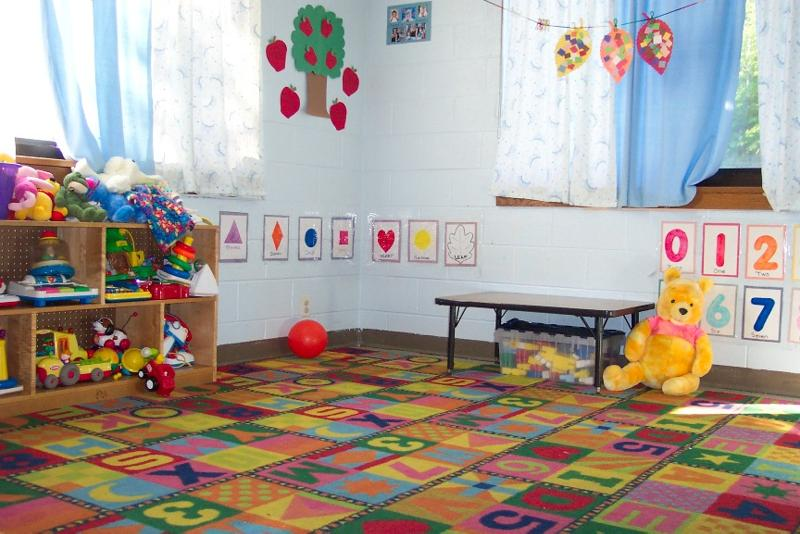

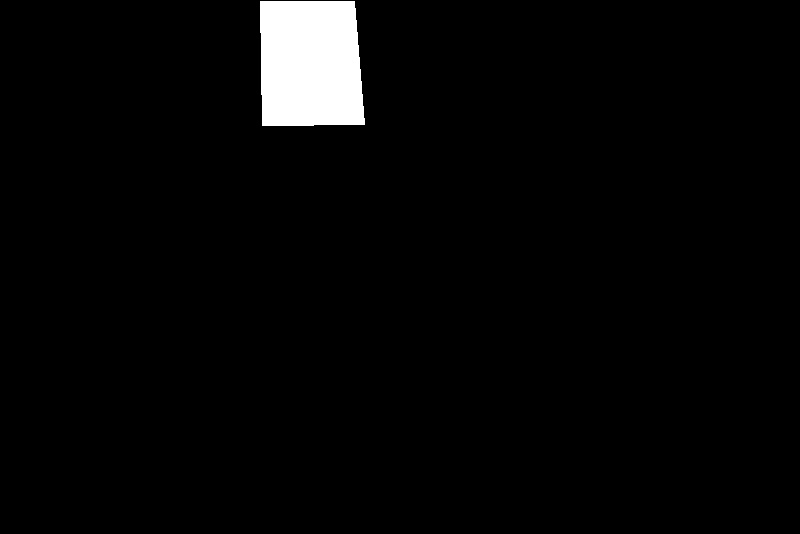

pictures are in wall


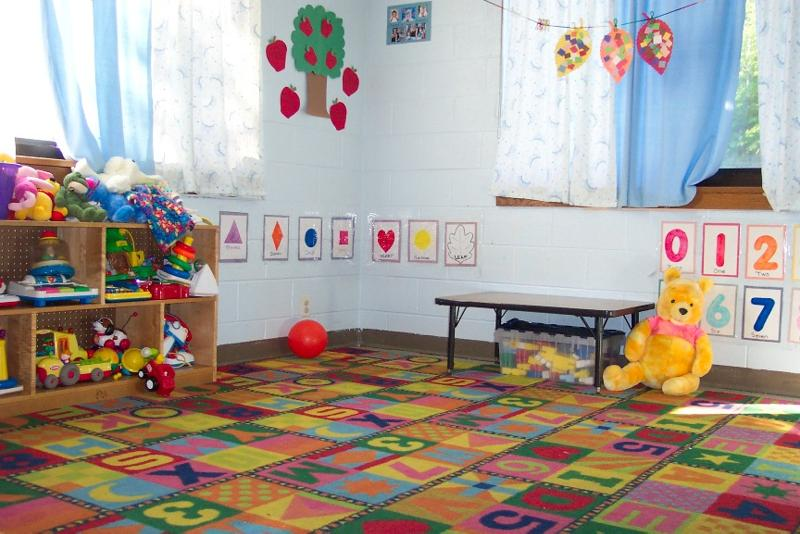

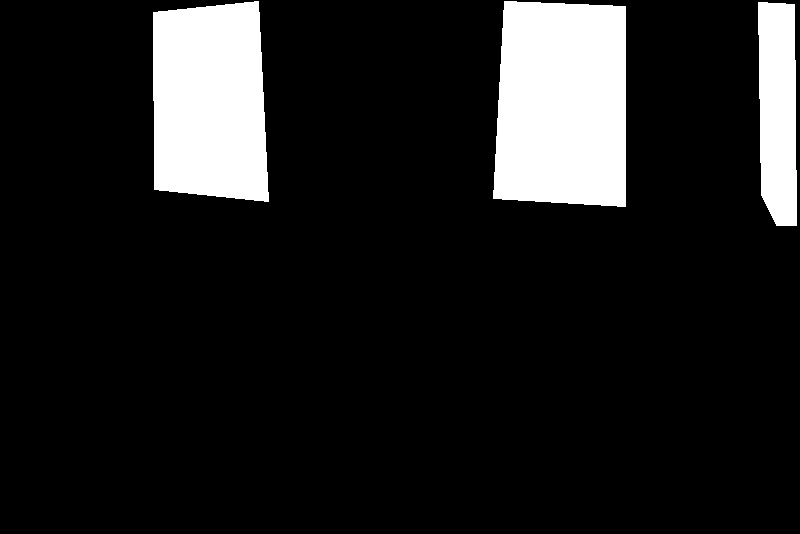

white curtain


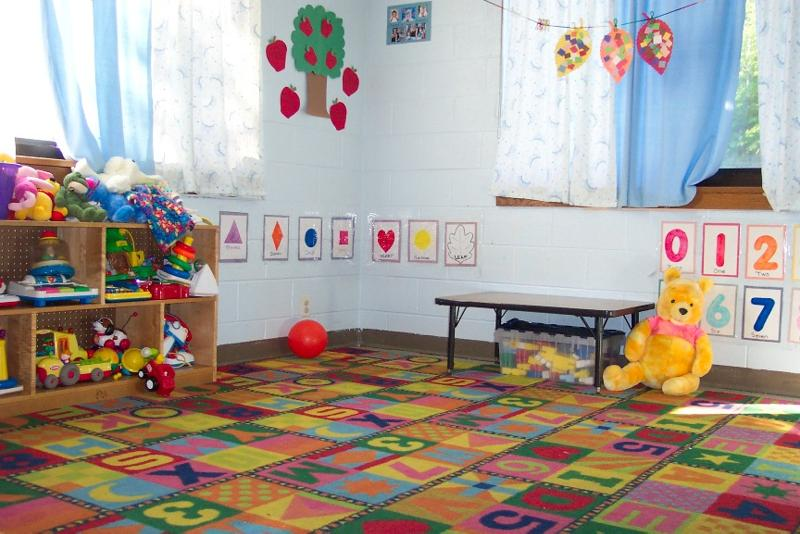

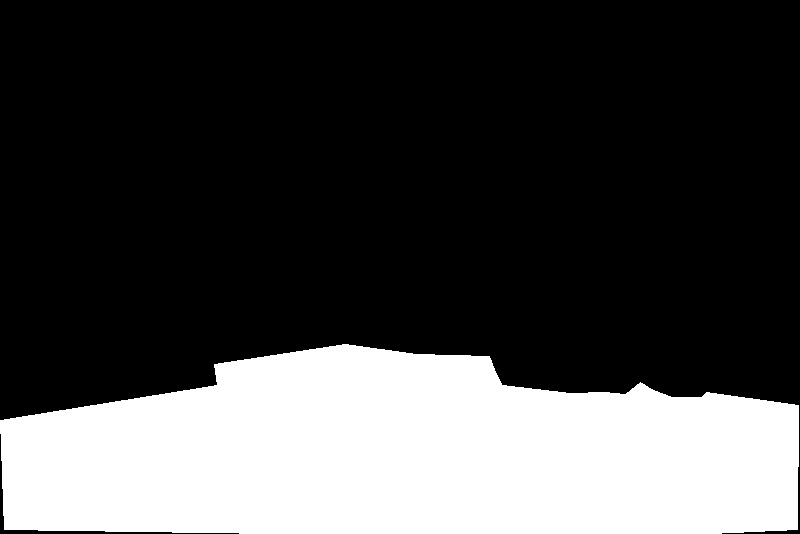

rug


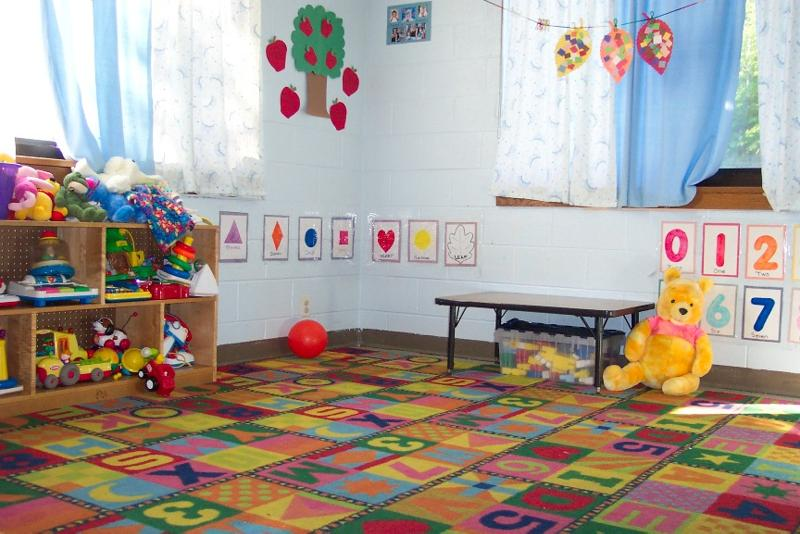

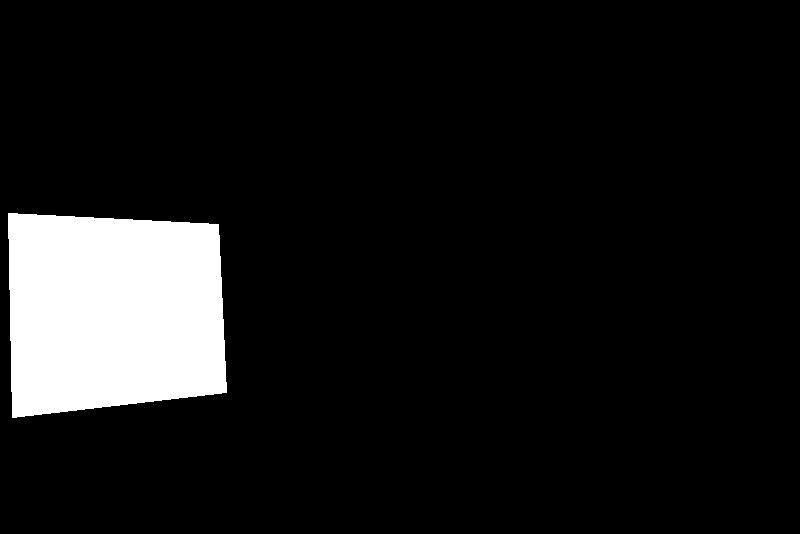

wooden shelf


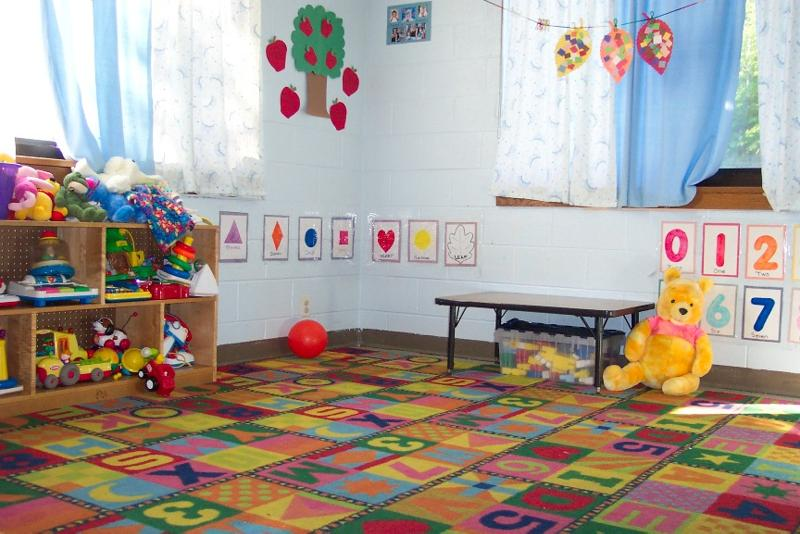

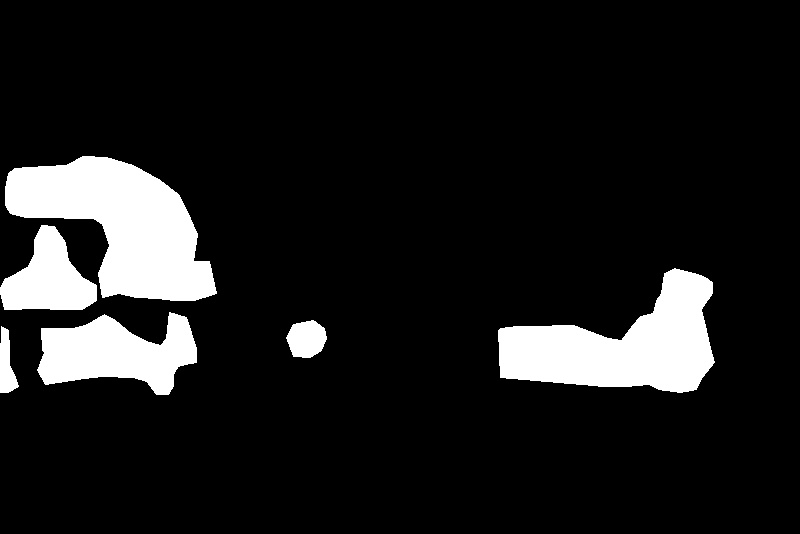

toys


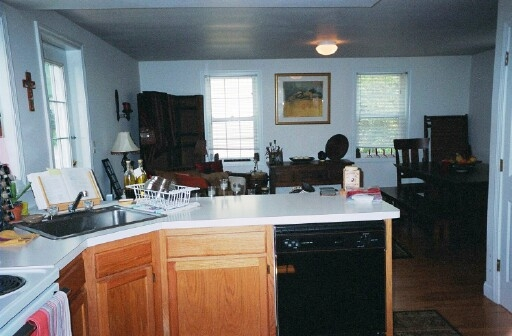

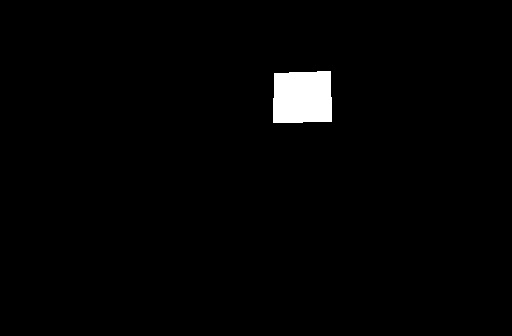

frame


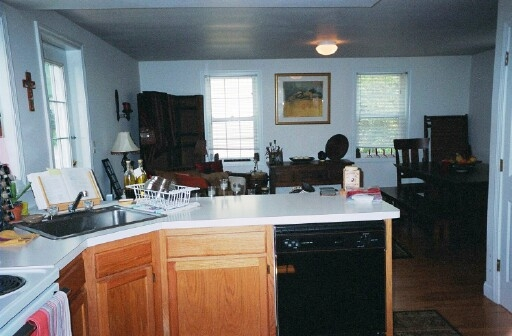

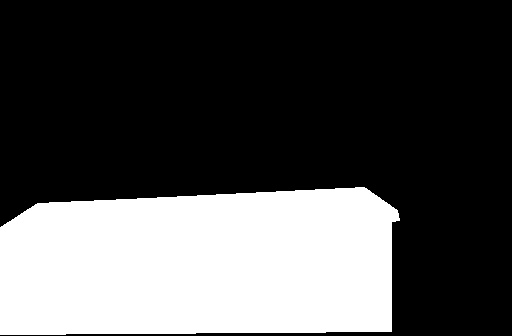

cabinets


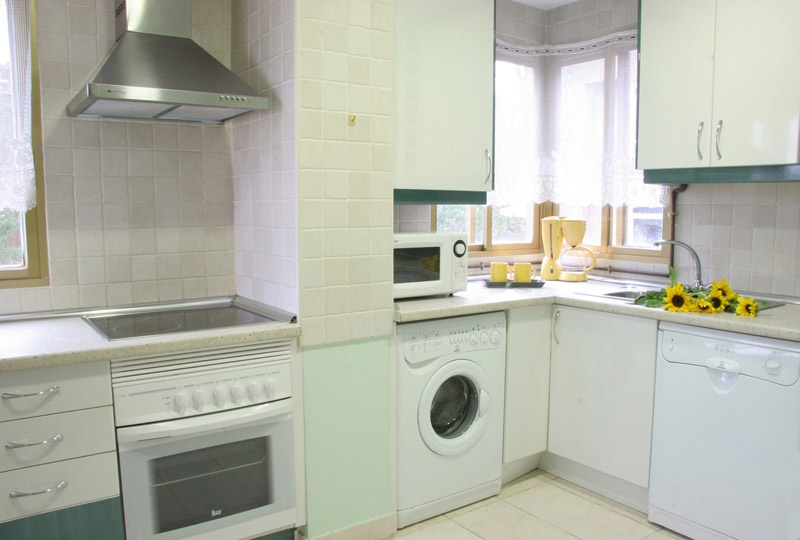

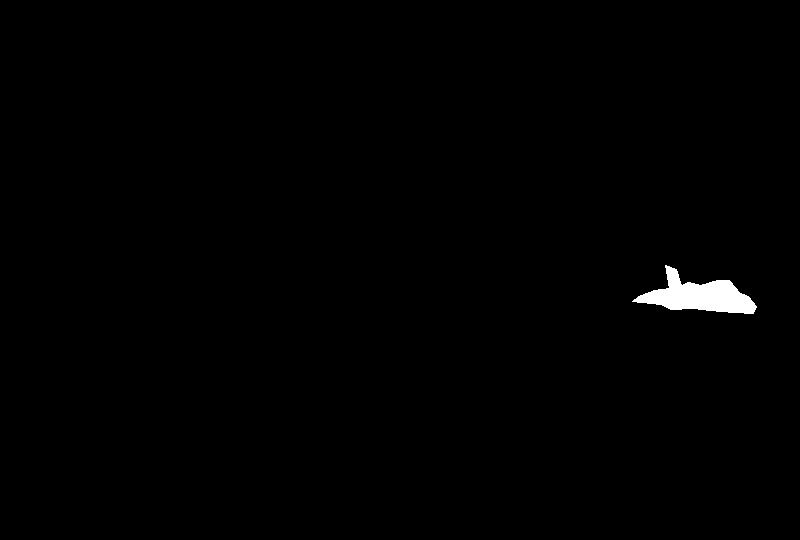

sun flowers


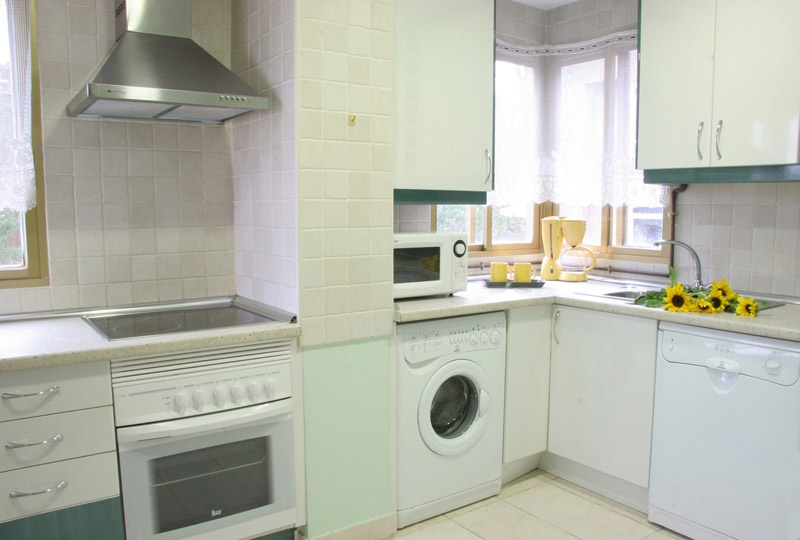

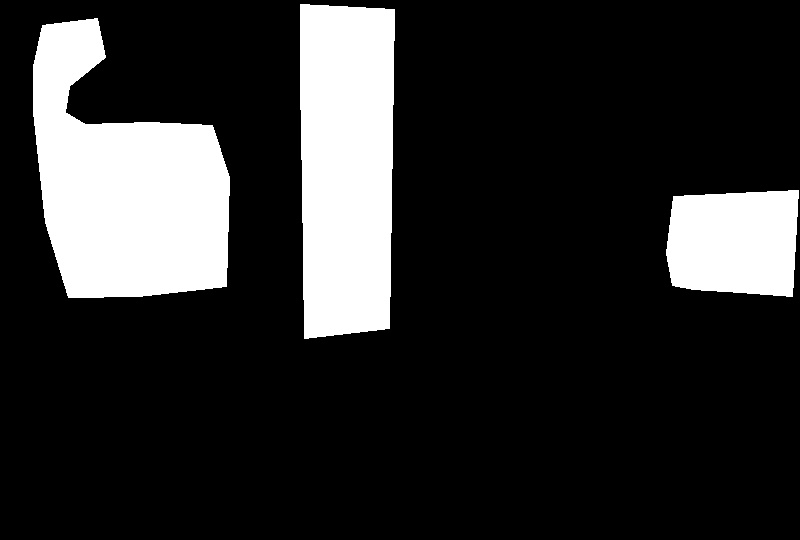

walls


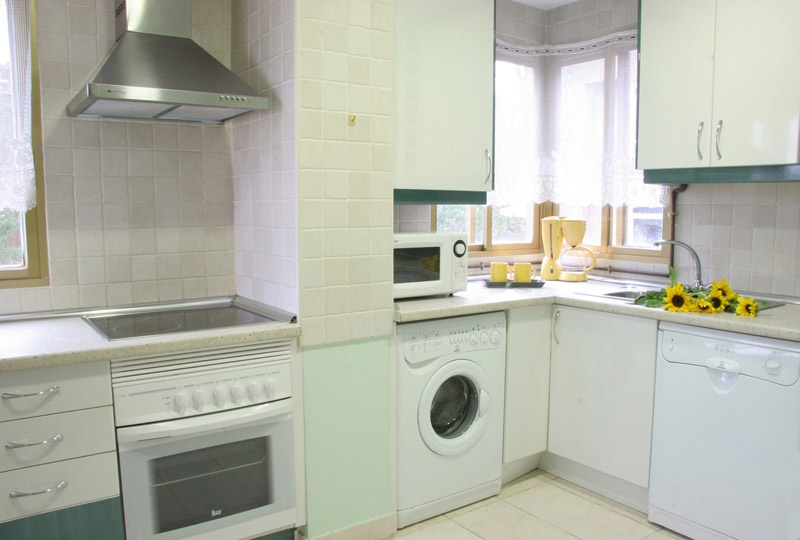

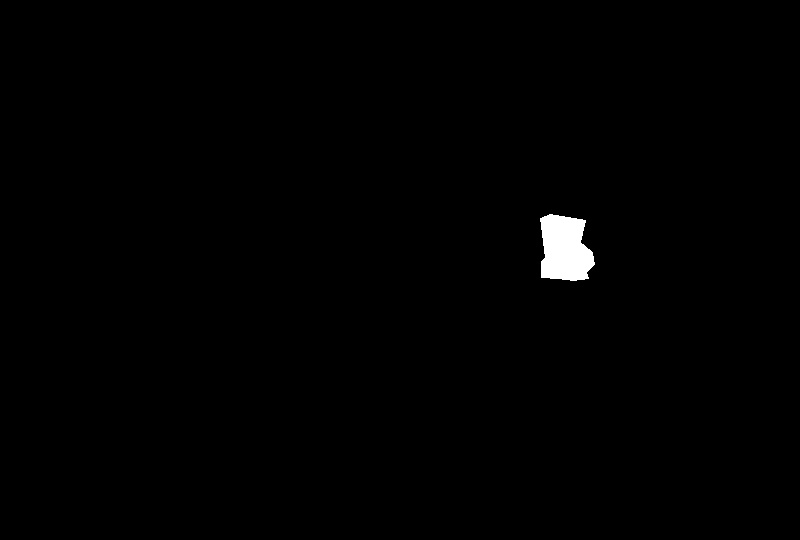

coffee maker on counter


In [7]:
#Some sample images, masks and their phrases
df = pd.read_csv("train_data.csv")
for i in range(10):
    temp_ip = Image.open("phrasecut_dataset/VGPhraseCut_V0_sub_train+val/train/images/%s.jpg" % df['image_id'][i])
    display(temp_ip)
    temp_op = Image.open("train_mask/%s.jpg" % (str(df['image_id'][i]) + ".jpg_" + str(df['phrase'][i])))
    display(temp_op)
    print(df['phrase'][i])

In [8]:
torch.cuda.empty_cache()

Importing and Loading the CLIP model

In [9]:
#Importing Clip model
! conda install --yes -c pytorch pytorch=1.7.1 torchvision cudatoolkit=11.0
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

^C
  Cloning https://github.com/openai/CLIP.git to c:\users\anuj\appdata\local\temp\pip-req-build-5mkrnvzg
  Resolved https://github.com/openai/CLIP.git to commit a1d071733d7111c9c014f024669f959182114e33
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git 'C:\Users\Anuj\AppData\Local\Temp\pip-req-build-5mkrnvzg'


In [10]:
# Load CLIP model
clip_model, preprocess = clip.load('ViT-B/32', device=device)
clip_model.eval()

CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32), bias=False)
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): Sequential(
        (0): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): QuickGELU()
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
        (1): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          

Encoder functions using CLIP model

In [11]:
def encode_pil_image(pil_image):
    # Preprocess image
    image = preprocess(pil_image).unsqueeze(0).to(device)
    # image = preprocess(pil_image).to(device)
    with torch.no_grad():
        image_features = clip_model.encode_image(image).detach()
    return image_features

def encode_text(phrases):
    # Encode text prompts
    text_features = []
    for prompt in phrases:
        # text = clip.tokenize([prompt]).to(device)
        with torch.no_grad():
            text = clip.tokenize([prompt]).to(device)
            text_feature = clip_model.encode_text(text).detach()
        text_features.append(text_feature)
    
    text_features = torch.cat(text_features, dim=0)
    return text_features

Creating custom Decoder

In [12]:
class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)
        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)
        self.relu = nn.ReLU()
    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        return x

In [13]:
class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c, out_c)
    def forward(self, inputs):
        x = self.up(inputs)
        x = self.conv(x)
        return x

In [14]:
class build_decoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.d1 = decoder_block(1024, 512)
        self.d2 = decoder_block(512, 256)
        self.d3 = decoder_block(256, 128)
        self.d4 = decoder_block(128, 64)
        self.d5 = decoder_block(64, 32)
        self.d6 = decoder_block(32, 16)
        self.d7 = decoder_block(16, 8)
        self.d8 = decoder_block(8, 4)
        self.d9 = decoder_block(4, 2)
        self.d10 = decoder_block(2, 1)
    def forward(self, inputs):
        x = self.d1(inputs)
        x = self.d2(x)
        x = self.d3(x)
        x = self.d4(x)
        x = self.d5(x)
        x = self.d6(x)
        x = self.d7(x)
        x = self.d8(x)
        x = self.d9(x)
        x = self.d10(x)
        return x

In [15]:
# Showing sample input and output sizes for decoder
inputs = torch.randn((1, 1024, 1, 1))
decoder = build_decoder()
output = decoder(inputs)
print(output.size())

torch.Size([1, 1, 1024, 1024])


Creating DataLoader class

In [16]:
#Creating custom dataloader class

class PhraseCutDataset(Dataset):
    def __init__(self, split = None):
        super(PhraseCutDataset, self).__init__()
        self.transform = transforms.Compose([transforms.ToTensor()])
        if split == 'train':
            df = pd.read_csv("train_data.csv")
            self.size = 30695
            self.phrase = df["phrase"][0:30695]
            self.task_id = df["task_id"][0:30695]
            self.input_images = []
            self.outputs = []
            for i in range(self.size):
                temp_ip = Image.open("phrasecut_dataset/VGPhraseCut_V0_sub_train+val/train/images/%s.jpg" % df['image_id'][i])
                temp_op = Image.open("train_mask/%s.jpg" % (str(df['image_id'][i]) + ".jpg_" + str(self.phrase[i])))
                temp_ip_new = temp_ip.resize((224,224))
                temp_op_new = temp_op.resize(((224, 224)), resample=Image.NEAREST)
                # Threshold the resized mask
                threshold = 128 
                temp_op_new = np.where(np.array(temp_op_new) >= threshold, 255, 0)
                self.input_images.append(np.array(temp_ip_new))
                self.outputs.append(temp_op_new)

        elif split == 'mini_train':
            df = pd.read_csv("train_data.csv")
            self.size = 100
            self.phrase = df["phrase"][0:100]
            self.task_id = df["task_id"][0:100]
            self.input_images = []
            self.outputs = []
            for i in range(self.size):
                temp_ip = Image.open("phrasecut_dataset/VGPhraseCut_V0_sub_train+val/train/images/%s.jpg" % df['image_id'][i])
                temp_op = Image.open("train_mask/%s.jpg" % (str(df['image_id'][i]) + ".jpg_" + str(self.phrase[i])))
                temp_ip_new = temp_ip.resize((224,224))
                temp_op_new = temp_op.resize(((224, 224)), resample=Image.NEAREST)
                # Threshold the resized mask
                threshold = 128 
                temp_op_new = np.where(np.array(temp_op_new) >= threshold, 255, 0)
                self.input_images.append(np.array(temp_ip_new))
                self.outputs.append(temp_op_new)
            
        elif split == 'val':
            df = pd.read_csv("val_data.csv")
            self.size = 994
            self.phrase = df["phrase"][0:994]
            self.task_id = df["task_id"][0:994]
            self.input_images = []
            self.outputs = []
            for i in range(self.size):
                temp_ip = Image.open("phrasecut_dataset/VGPhraseCut_V0_sub_train+val/val/images/%s.jpg" % df['image_id'][i])
                temp_op = Image.open("val_mask/%s.jpg" % (str(df['image_id'][i]) + ".jpg_" + str(self.phrase[i])))
                temp_ip_new = temp_ip.resize((224,224))
                temp_op_new = temp_op.resize((224,224), resample=Image.NEAREST)
                temp_ip_new = temp_ip.resize((224,224))
                temp_op_new = temp_op.resize(((224, 224)), resample=Image.NEAREST)
                # Threshold the resized mask
                threshold = 128 
                temp_op_new = np.where(np.array(temp_op_new) >= threshold, 255, 0)
                self.input_images.append(np.array(temp_ip_new))
                self.outputs.append(temp_op_new)
                
        elif split == 'test':
            df = pd.read_csv("val_data.csv")
            self.size = 500
            self.phrase = df["phrase"][1003:1503]
            self.task_id = df["task_id"][1003:1503]
            self.input_images = []
            self.outputs = []
            for i in range(self.size):
                temp_ip = Image.open("phrasecut_dataset/VGPhraseCut_V0_sub_train+val/val/images/%s.jpg" % df['image_id'][i+1003])
                temp_op = Image.open("val_mask/%s.jpg" % (str(df['image_id'][i+1003]) + ".jpg_" + str(self.phrase[i+1003])))
                temp_ip_new = temp_ip.resize((224,224))
                temp_op_new = temp_op.resize(((224, 224)), resample=Image.NEAREST)
                # Threshold the resized mask
                threshold = 128 
                temp_op_new = np.where(np.array(temp_op_new) >= threshold, 255, 0)
                self.input_images.append(np.array(temp_ip_new))
                self.outputs.append(temp_op_new)

    def __getitem__(self, index):
        # return self.transform(self.input_images[index]), self.transform(self.outputs[index]), self.transform(self.phrase[index]), self.transform(self.task_id[index])
        return self.input_images[index], self.outputs[index], self.phrase[index], self.task_id[index]

    def __len__(self):
        return self.size

In [17]:
torch.manual_seed(42)
tic = time.time()
data = PhraseCutDataset('mini_train')
mini_train = DataLoader(data, batch_size=1, shuffle=False)
toc = time.time()
print(f"mini_train set loaded. Time taken = {toc - tic} sec")

mini_train set loaded. Time taken = 1.0289559364318848 sec


In [20]:
torch.manual_seed(42)
tic = time.time()
data = PhraseCutDataset('train')
train = DataLoader(data, batch_size=1, shuffle=False)
toc = time.time()
print(f"train set loaded. Time taken = {toc - tic} sec")

train set loaded. Time taken = 586.4703114032745 sec


In [18]:
torch.manual_seed(42)
tic = time.time()
data = PhraseCutDataset('val')
val = DataLoader(data, batch_size=1, shuffle=False)
toc = time.time()
print(f"val set loaded. Time taken = {toc - tic} sec")

val set loaded. Time taken = 11.611373662948608 sec


In [19]:
torch.manual_seed(42)
tic = time.time()
data = PhraseCutDataset('test')
test = DataLoader(data, batch_size=1, shuffle=False)
toc = time.time()
print(f"test set loaded. Time taken = {toc - tic} sec")

test set loaded. Time taken = 5.348551511764526 sec


Building Decoder

In [ ]:
decoder = build_decoder().to(device)
criterion = nn.MSELoss()
# optimizer = torch.optim.Adam(decoder.parameters(), lr=1e-5)
optimizer = torch.optim.SGD(decoder.parameters(), lr=1e-3, momentum = 0.9)
sigmoid = nn.Sigmoid()

Training Loop

Epoch: 1/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


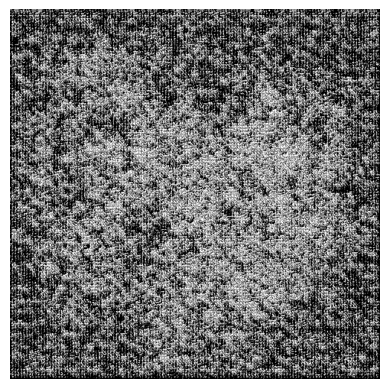

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


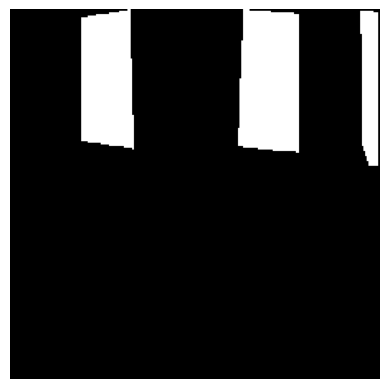

Epoch: 2/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


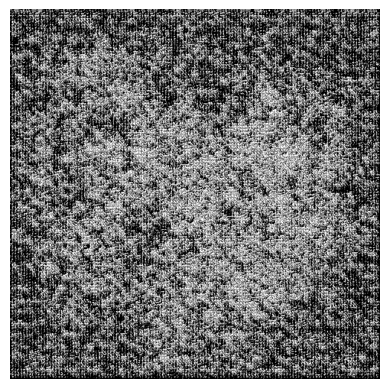

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


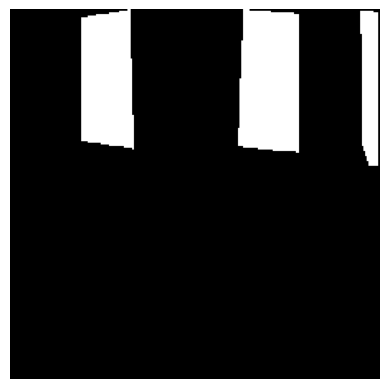

Epoch: 3/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


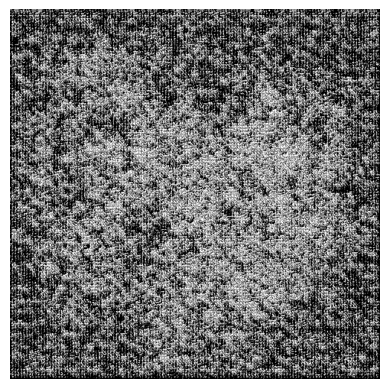

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


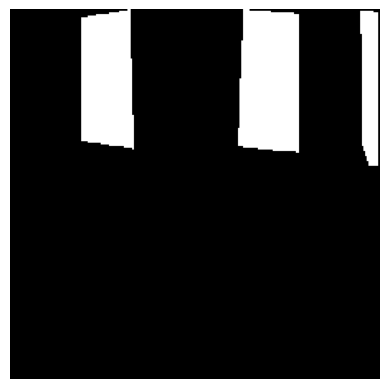

Epoch: 4/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


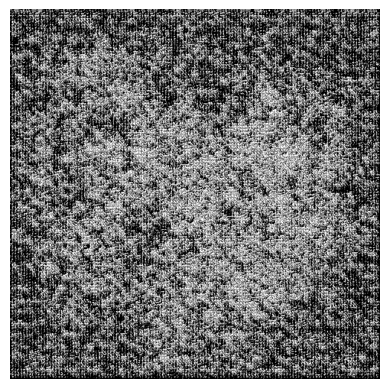

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


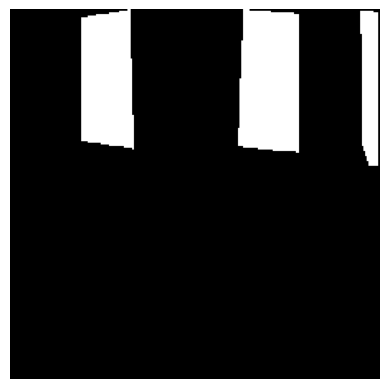

Epoch: 5/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


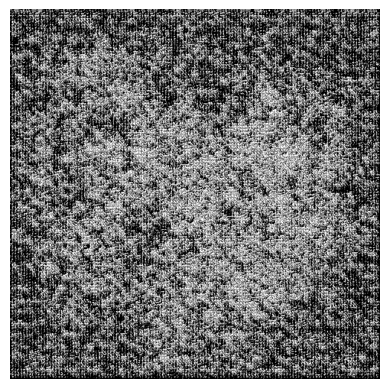

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


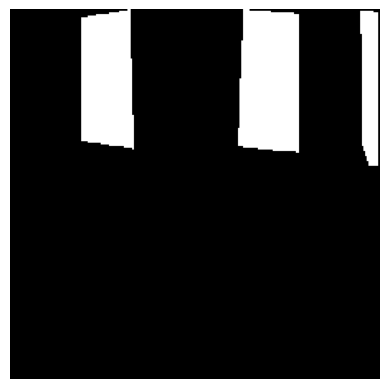

Epoch: 6/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


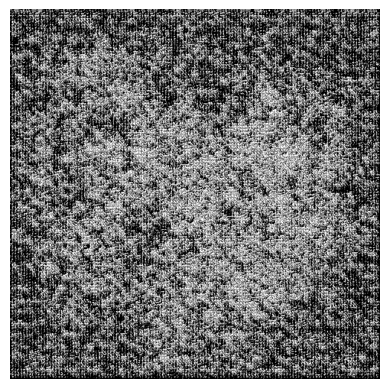

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


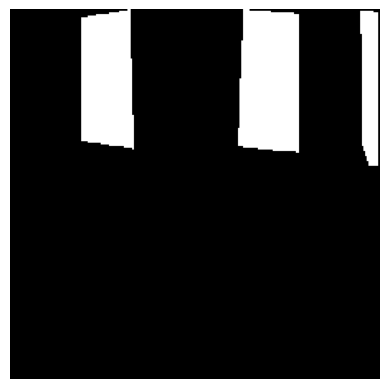

Epoch: 7/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


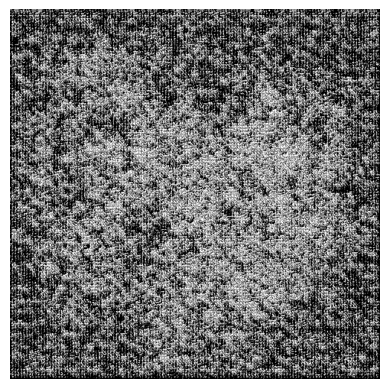

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


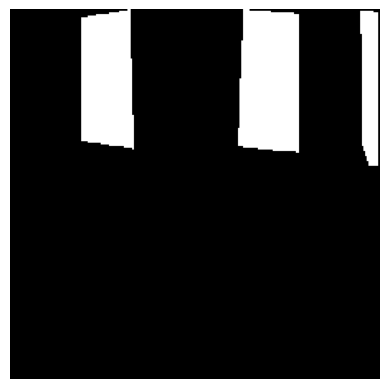

Epoch: 8/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


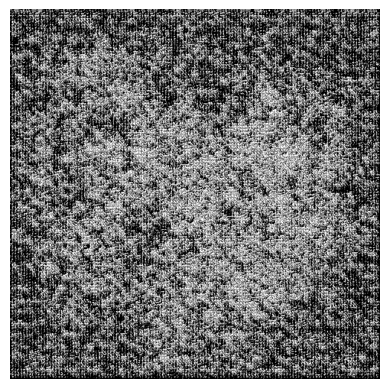

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


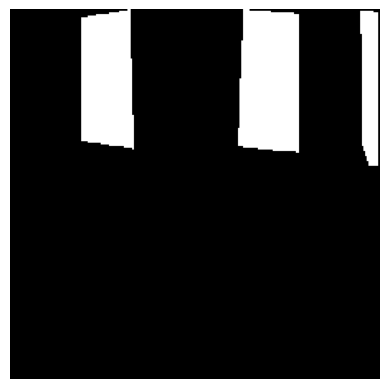

Epoch: 9/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


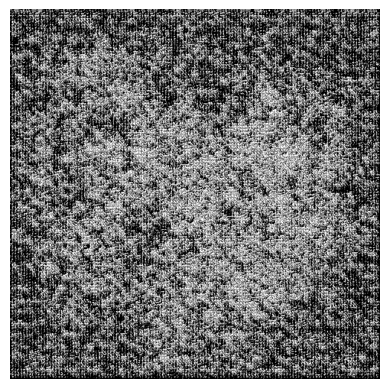

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


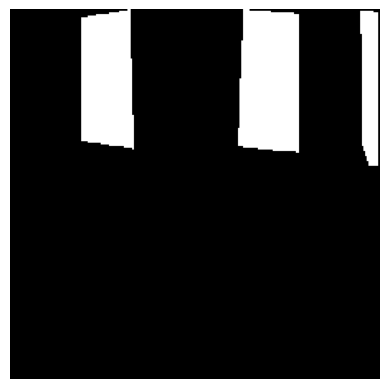

Epoch: 10/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


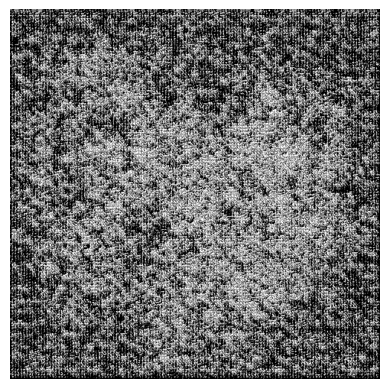

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


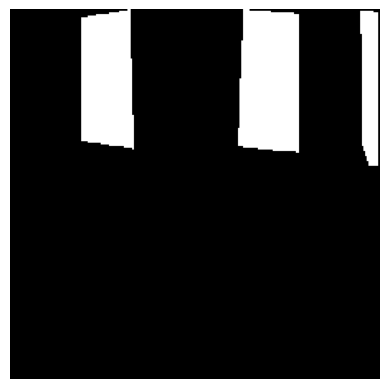

Epoch: 11/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


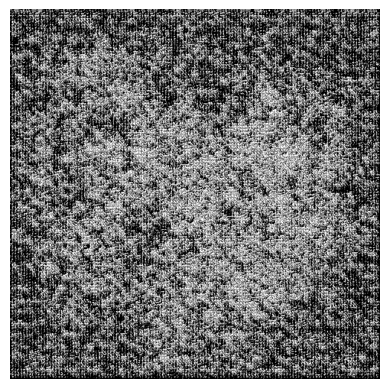

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


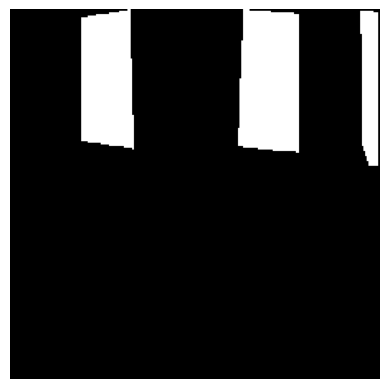

Epoch: 12/50, Iteration: 2, Loss : 27976.76953125
Unqiue of segmentation map:  tensor([  0., 255.], device='cuda:0') torch.Size([1024, 1024])
Segmentation map produced: 


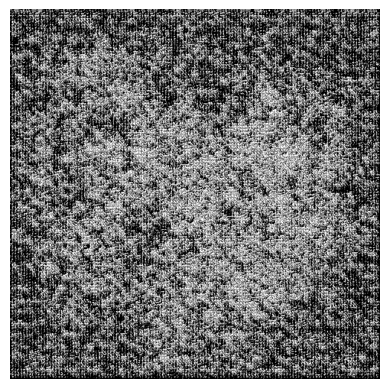

Unqiue of expected op_image:  tensor([  0., 255.]) torch.Size([1024, 1024])
Actual Segmentation: 


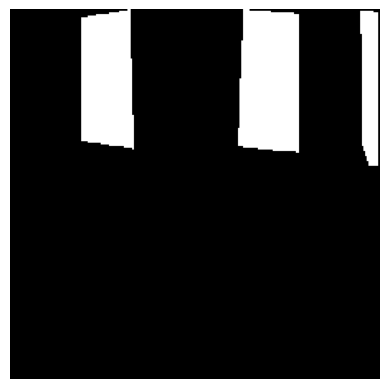

KeyboardInterrupt: 

In [17]:
#Training Loop
n_total_steps = len(train)
loss_history = []
complete_loss_history = []
num_epochs = 50
for epoch in range(num_epochs):
    for i, (ip_image, op_image, phrase, task_id) in enumerate(train):
        if ip_image.dim() != 4:
            continue
        # Reshape the tensor to match the PIL image format (HWC -> CHW)
        # [1, 224, 224, 3] -> [1, 3, 224, 224]
        tensor_image = ip_image.permute(0, 3, 1, 2)

        op_image = transforms.ToPILImage()(op_image)
        op_image = op_image.resize((1024, 1024), resample=Image.NEAREST)
        threshold = 128
        op_image = np.where(np.array(op_image) >= threshold, 255, 0)
        op_image = transforms.ToTensor()(op_image)
        
        pil_image = transforms.ToPILImage()(tensor_image.squeeze())
        image_features = encode_pil_image(pil_image)
        text_features = encode_text(phrase)

        combined_features = torch.cat((text_features, image_features.repeat(text_features.size(0), 1)), dim=1)
        combined_features = combined_features.unsqueeze(2).unsqueeze(3)
        segmentation_map = decoder(combined_features.float())
        segmentation_map = sigmoid(segmentation_map)
        
        # Perform thresholding to convert the values
        threshold = 0.5
        segmentation_map = (segmentation_map > threshold).float()
        segmentation_map = segmentation_map*255

        op_image = op_image.float()

        segmentation_map = segmentation_map.squeeze()
        op_image = op_image.squeeze()
        loss = criterion(segmentation_map.detach().requires_grad_(True).to(device), op_image.detach().to(device))

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1)%2000 == 0:
          complete_loss_history.append(loss.item())

        if task_id == ('4276__4367131',):
            print(f"Epoch: {epoch+1}/{num_epochs}, Iteration: {i+1}, Loss : {loss.item()}")
            loss_history.append(loss.item())

            #Displaying the segmentation produced
            print("Unqiue of segmentation map: ", torch.unique(segmentation_map), segmentation_map.size())
            print("Segmentation map produced: ")
            image = segmentation_map.squeeze().detach().cpu().numpy()
            plt.imshow(image, cmap='gray')
            plt.axis('off')
            plt.show()

            #Displaying the actual segmentation
            print("Unqiue of expected op_image: ", torch.unique(op_image), op_image.size())
            print("Actual Segmentation: ")
            image = op_image.squeeze().detach().cpu().numpy()
            plt.imshow(image, cmap='gray')
            plt.axis('off')
            plt.show()
